In [1]:
# prune these

# for grabbing data from APIs
import urllib, json
import requests

# for working with the data
import pandas as pd
import numpy as np
import datetime as dt
from pandasgui import show

# for visualization 
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.collections import PolyCollection
import seaborn as sns
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px
from pywaffle import Waffle

# for geodata and GIS prep
import geopandas as gpd
from geopandas import GeoDataFrame

# for mapping
import folium
from shapely.geometry import Point, Polygon
from keplergl import KeplerGl

In [2]:
%%time
# Get the Neighbourhood Profiles data
# See https://docs.ckan.org/en/latest/maintaining/datastore.html for detailed parameters options
url = "https://ckan0.cf.opendata.inter.prod-toronto.ca/api/3/action/package_show"
params = { "id": "6e19a90f-971c-46b3-852c-0c48c436d1fc"}
package = requests.get(url, params = params).json()

for idx, resource in enumerate(package["result"]["resources"]):
    if resource["datastore_active"]:
        url = "https://ckan0.cf.opendata.inter.prod-toronto.ca/api/3/action/datastore_search"
        p = { "id": resource["id"], "limit": 3000 }
        data = requests.get(url, params = p).json()
        hood_df = pd.DataFrame(data["result"]["records"])
        break

CPU times: user 352 ms, sys: 107 ms, total: 459 ms
Wall time: 6.57 s


In [4]:
%%time
# Get the COVID-19 Cases in Toronto data
# https://open.toronto.ca/dataset/covid-19-cases-in-toronto/
url = "https://ckan0.cf.opendata.inter.prod-toronto.ca/api/3/action/package_show"
params = { "id": "64b54586-6180-4485-83eb-81e8fae3b8fe"}
package = requests.get(url, params = params).json()
for idx, resource in enumerate(package["result"]["resources"]):
    if resource["datastore_active"]:
        url = "https://ckan0.cf.opendata.inter.prod-toronto.ca/api/3/action/datastore_search"
        p = { "id": resource["id"], "limit": 200000 }
        data = requests.get(url, params = p).json()
        cases_df = pd.DataFrame(data["result"]["records"])
        break

CPU times: user 3.23 s, sys: 1.05 s, total: 4.29 s
Wall time: 27 s


In [5]:
# get info about the two datasets
# hood_df.info()
# cases_df.info()

In [6]:
# get rid of all the commas
hood_df = hood_df.replace(',','', regex=True)
hood_df.head(5)

,_id,Category,Topic,Data Source,Characteristic,City of Toronto,Agincourt North,Agincourt South-Malvern West,Alderwood,Annex,...,Willowdale West,Willowridge-Martingrove-Richview,Woburn,Woodbine Corridor,Woodbine-Lumsden,Wychwood,Yonge-Eglinton,Yonge-St.Clair,York University Heights,Yorkdale-Glen Park
0,1,Neighbourhood Information,Neighbourhood Information,City of Toronto,Neighbourhood Number,n/a,129,128,20,95,...,37,7,137,64,60,94,100,97,27,31
1,2,Neighbourhood Information,Neighbourhood Information,City of Toronto,TSNS2020 Designation,n/a,No Designation,No Designation,No Designation,No Designation,...,No Designation,No Designation,NIA,No Designation,No Designation,No Designation,No Designation,No Designation,NIA,Emerging Neighbourhood
2,3,Population,Population and dwellings,Census Profile 98-316-X2016001,Population 2016,2731571,29113,23757,12054,30526,...,16936,22156,53485,12541,7865,14349,11817,12528,27593,14804
3,4,Population,Population and dwellings,Census Profile 98-316-X2016001,Population 2011,2615060,30279,21988,11904,29177,...,15004,21343,53350,11703,7826,13986,10578,11652,27713,14687
4,5,Population,Population and dwellings,Census Profile 98-316-X2016001,Population Change 2011-2016,4.50%,-3.90%,8.00%,1.30%,4.60%,...,12.90%,3.80%,0.30%,7.20%,0.50%,2.60%,11.70%,7.50%,-0.40%,0.80%


In [7]:
# probably not using everything all at once, so separate the different categories (e.g. income, language) into their own DFs

# what are all the different categories and classifications?
hood_df.Category.unique()
cases_df.Classification.unique()

array(['CONFIRMED', 'PROBABLE'], dtype=object)

In [8]:
cases_df = cases_df.replace(',','', regex=True)
cases_df.head(2)

,_id,Assigned_ID,Outbreak Associated,Age Group,Neighbourhood Name,FSA,Source of Infection,Classification,Episode Date,Reported Date,Client Gender,Outcome,Currently Hospitalized,Currently in ICU,Currently Intubated,Ever Hospitalized,Ever in ICU,Ever Intubated
0,2001646,125261,Sporadic,20 to 29 Years,Brookhaven-Amesbury,M9N,Community,CONFIRMED,2021-04-04,2021-04-08,MALE,RESOLVED,No,No,No,No,No,No
1,2001647,125262,Sporadic,50 to 59 Years,Kingsway South,M8X,No Information,CONFIRMED,2021-04-07,2021-04-08,FEMALE,RESOLVED,No,No,No,No,No,No


In [9]:
# find record of one of the neighbourhoods with misspelled name
# cases_df[cases_df['Neighbourhood Name'].str.contains("Pellam")]

# fix name discrepancies for danforth east york, briar hill-belgravia, and weston-pelham park
# Pelham Park
cases_df['Neighbourhood Name'] = cases_df['Neighbourhood Name'].replace('Weston-Pellam Park', 'Weston-Pelham Park') 
# Danforth East York
cases_df['Neighbourhood Name'] = cases_df['Neighbourhood Name'].replace('Danforth-East York', 'Danforth East York') 
# Brial Hill-Belgravia
cases_df['Neighbourhood Name'] = cases_df['Neighbourhood Name'].replace('Briar Hill - Belgravia', 'Briar Hill-Belgravia') 

In [10]:
# cases_df['count'] = cases_df.groupby('Neighbourhood Name')['Neighbourhood Name'].transform('count')
# cases_df.head()

# if we want to get data without filtering based on classification
# neighbourhood_count = cases_df.groupby(['Neighbourhood Name']).agg(['count'])

# if we want to get counts of confirmed cases only
# need to email city to find out what they're using in the excel spreadsheet they're using on tableau
counts = cases_df.groupby('Neighbourhood Name')['Classification'].apply(lambda x: (x=='CONFIRMED').sum()).reset_index(name='count')

In [11]:
counts.head()

,Neighbourhood Name,count
0,Agincourt North,1339
1,Agincourt South-Malvern West,1183
2,Alderwood,473
3,Annex,904
4,Banbury-Don Mills,875


In [12]:
row_counts = counts.pivot_table(columns='Neighbourhood Name')

PandasGUI INFO — numexpr.utils — NumExpr defaulting to 8 threads.


In [13]:
row_counts.insert(0, '_id', 1)
row_counts.insert(1, 'Category', 1)
row_counts.insert(2, 'Topic', 1)
row_counts.insert(3, 'Data Source', 1)
row_counts.insert(4, 'Characteristic', 1)
row_counts.insert(5, 'City of Toronto', 1)

In [14]:
row_counts.head(1)

Neighbourhood Name,_id,Category,Topic,Data Source,Characteristic,City of Toronto,Agincourt North,Agincourt South-Malvern West,Alderwood,Annex,...,Willowdale West,Willowridge-Martingrove-Richview,Woburn,Woodbine Corridor,Woodbine-Lumsden,Wychwood,Yonge-Eglinton,Yonge-St.Clair,York University Heights,Yorkdale-Glen Park
count,1,1,1,1,1,1,1339,1183,473,904,...,507,1290,4382,309,276,572,279,270,3135,1452


In [15]:
row_counts.reset_index(None)
row_counts = row_counts.rename_axis(None)

In [16]:
row_counts.loc[hood_df.index[2]] = hood_df.iloc[2]

In [17]:
row_counts.head(3)

Neighbourhood Name,_id,Category,Topic,Data Source,Characteristic,City of Toronto,Agincourt North,Agincourt South-Malvern West,Alderwood,Annex,...,Willowdale West,Willowridge-Martingrove-Richview,Woburn,Woodbine Corridor,Woodbine-Lumsden,Wychwood,Yonge-Eglinton,Yonge-St.Clair,York University Heights,Yorkdale-Glen Park
count,1,1,1,1,1,1,1339,1183,473,904,...,507,1290,4382,309,276,572,279,270,3135,1452
2,3,Population,Population and dwellings,Census Profile 98-316-X2016001,Population 2016,2731571,29113,23757,12054,30526,...,16936,22156,53485,12541,7865,14349,11817,12528,27593,14804


In [18]:
# row_counts.set_value(1, '_id', 0)
row_counts.loc[2,'_id'] = 1
row_counts.loc[2,'Category'] = 1
row_counts.loc[2,'Topic'] = 1
row_counts.loc[2,'Data Source'] = 1
row_counts.loc[2,'Characteristic'] = 1
row_counts.loc[2,'City of Toronto'] = 1

In [19]:
row_counts.head(2)

Neighbourhood Name,_id,Category,Topic,Data Source,Characteristic,City of Toronto,Agincourt North,Agincourt South-Malvern West,Alderwood,Annex,...,Willowdale West,Willowridge-Martingrove-Richview,Woburn,Woodbine Corridor,Woodbine-Lumsden,Wychwood,Yonge-Eglinton,Yonge-St.Clair,York University Heights,Yorkdale-Glen Park
count,1,1,1,1,1,1,1339,1183,473,904,...,507,1290,4382,309,276,572,279,270,3135,1452
2,1,1,1,1,1,1,29113,23757,12054,30526,...,16936,22156,53485,12541,7865,14349,11817,12528,27593,14804


In [20]:
row_counts.reset_index(drop=True, inplace=True)
row_counts.head()

Neighbourhood Name,_id,Category,Topic,Data Source,Characteristic,City of Toronto,Agincourt North,Agincourt South-Malvern West,Alderwood,Annex,...,Willowdale West,Willowridge-Martingrove-Richview,Woburn,Woodbine Corridor,Woodbine-Lumsden,Wychwood,Yonge-Eglinton,Yonge-St.Clair,York University Heights,Yorkdale-Glen Park
0,1,1,1,1,1,1,1339,1183,473,904,...,507,1290,4382,309,276,572,279,270,3135,1452
1,1,1,1,1,1,1,29113,23757,12054,30526,...,16936,22156,53485,12541,7865,14349,11817,12528,27593,14804


In [21]:
#row_counts = row_counts.astype('int64')
cols = row_counts.columns
row_counts[cols] = row_counts[cols].apply(pd.to_numeric, errors='coerce')
# row_counts = pd.to_numeric(row_counts, errors='coerce')

In [22]:
# # add a new row for rate per 100k
# 100000/row 2 value * row 0 value
row_counts.loc[-1] = 100000 / row_counts.iloc[1] * row_counts.iloc[0]  # adding a row
row_counts.index = row_counts.index + 1  # shifting index
row_counts.sort_index(inplace=True) 

In [23]:
row_counts.head()

Neighbourhood Name,_id,Category,Topic,Data Source,Characteristic,City of Toronto,Agincourt North,Agincourt South-Malvern West,Alderwood,Annex,...,Willowdale West,Willowridge-Martingrove-Richview,Woburn,Woodbine Corridor,Woodbine-Lumsden,Wychwood,Yonge-Eglinton,Yonge-St.Clair,York University Heights,Yorkdale-Glen Park
0,100000.0,100000.0,100000.0,100000.0,100000.0,100000.0,4599.319891,4979.584964,3924.008628,2961.409946,...,2993.623051,5822.350605,8192.951295,2463.918348,3509.218055,3986.340512,2361.005331,2155.172414,11361.577212,9808.159957
1,1.0,1.0,1.0,1.0,1.0,1.0,1339.000000,1183.000000,473.000000,904.000000,...,507.000000,1290.000000,4382.000000,309.000000,276.000000,572.000000,279.000000,270.000000,3135.000000,1452.000000
2,1.0,1.0,1.0,1.0,1.0,1.0,29113.000000,23757.000000,12054.000000,30526.000000,...,16936.000000,22156.000000,53485.000000,12541.000000,7865.000000,14349.000000,11817.000000,12528.000000,27593.000000,14804.000000


In [24]:
row_counts = row_counts.drop([2])

In [25]:
# combine with the neighbourhood data
frames = [row_counts, hood_df]
hood_df = pd.concat(frames)

# fix this so it doesn't create a new column
# hood_df.reset_index(None)
# hood_df.iloc[0].astype(int)
hood_df.head()

In [26]:
hood_df = hood_df.drop(['_id', 'Category', 'Topic', 'Data Source', 'City of Toronto'], axis = 1);

In [27]:
#hood_df['Characteristic'].astype(object)
# hood_df['Characteristic'].replace({100000: 'Rate', 1: 'Cases'})

# rename a different way
hood_df.Characteristic[hood_df.Characteristic == 100000] = "Rate"
hood_df.Characteristic[hood_df.Characteristic == 1] = "Cases"
hood_df.head()

,Characteristic,Agincourt North,Agincourt South-Malvern West,Alderwood,Annex,Banbury-Don Mills,Bathurst Manor,Bay Street Corridor,Bayview Village,Bayview Woods-Steeles,...,Willowdale West,Willowridge-Martingrove-Richview,Woburn,Woodbine Corridor,Woodbine-Lumsden,Wychwood,Yonge-Eglinton,Yonge-St.Clair,York University Heights,Yorkdale-Glen Park
0,Rate,4599.319891,4979.584964,3924.008628,2961.409946,3159.415057,9172.809173,2477.032213,2411.665732,4584.15691,...,2993.623051,5822.350605,8192.951295,2463.918348,3509.218055,3986.340512,2361.005331,2155.172414,11361.577212,9808.159957
1,Cases,1339.0,1183.0,473.0,904.0,875.0,1456.0,639.0,516.0,603.0,...,507.0,1290.0,4382.0,309.0,276.0,572.0,279.0,270.0,3135.0,1452.0
0,Neighbourhood Number,129,128,20,95,42,34,76,52,49,...,37,7,137,64,60,94,100,97,27,31
1,TSNS2020 Designation,No Designation,No Designation,No Designation,No Designation,No Designation,No Designation,No Designation,No Designation,No Designation,...,No Designation,No Designation,NIA,No Designation,No Designation,No Designation,No Designation,No Designation,NIA,Emerging Neighbourhood
2,Population 2016,29113,23757,12054,30526,27695,15873,25797,21396,13154,...,16936,22156,53485,12541,7865,14349,11817,12528,27593,14804


In [28]:
# create a pivot table and use Characteristic column as index
trans = hood_df.set_index('Characteristic').T

In [29]:
trans.head(5)

Characteristic,Rate,Cases,Neighbourhood Number,TSNS2020 Designation,Population 2016,Population 2011,Population Change 2011-2016,Total private dwellings,Private dwellings occupied by usual residents,Population density per square kilometre,...,Intraprovincial migrants,Interprovincial migrants,External migrants,Total - Mobility status 5 years ago - 25% sample data,Non-movers,Movers,Non-migrants,Migrants,Interprovincial migrants,External migrants
Agincourt North,4599.319891,1339.0,129,No Designation,29113,30279,-3.90%,9371,9120,3929,...,275,75,605,27490,18865,8610,5445,3170,135,2280
Agincourt South-Malvern West,4979.584964,1183.0,128,No Designation,23757,21988,8.00%,8535,8136,3034,...,320,90,490,22325,13565,8775,5610,3145,220,2170
Alderwood,3924.008628,473.0,20,No Designation,12054,11904,1.30%,4732,4616,2435,...,220,40,70,11370,8235,3130,2200,925,70,245
Annex,2961.409946,904.0,95,No Designation,30526,29177,4.60%,18109,15934,10863,...,900,385,835,27715,12980,14735,8340,6390,1310,2460
Banbury-Don Mills,3159.415057,875.0,42,No Designation,27695,26918,2.90%,12473,12124,2775,...,345,75,380,25925,16300,9625,6480,3140,220,1735


In [30]:
trans.reset_index(inplace = True)
trans.head()

Characteristic,index,Rate,Cases,Neighbourhood Number,TSNS2020 Designation,Population 2016,Population 2011,Population Change 2011-2016,Total private dwellings,Private dwellings occupied by usual residents,...,Intraprovincial migrants,Interprovincial migrants,External migrants,Total - Mobility status 5 years ago - 25% sample data,Non-movers,Movers,Non-migrants,Migrants,Interprovincial migrants,External migrants
0,Agincourt North,4599.319891,1339.0,129,No Designation,29113,30279,-3.90%,9371,9120,...,275,75,605,27490,18865,8610,5445,3170,135,2280
1,Agincourt South-Malvern West,4979.584964,1183.0,128,No Designation,23757,21988,8.00%,8535,8136,...,320,90,490,22325,13565,8775,5610,3145,220,2170
2,Alderwood,3924.008628,473.0,20,No Designation,12054,11904,1.30%,4732,4616,...,220,40,70,11370,8235,3130,2200,925,70,245
3,Annex,2961.409946,904.0,95,No Designation,30526,29177,4.60%,18109,15934,...,900,385,835,27715,12980,14735,8340,6390,1310,2460
4,Banbury-Don Mills,3159.415057,875.0,42,No Designation,27695,26918,2.90%,12473,12124,...,345,75,380,25925,16300,9625,6480,3140,220,1735


In [31]:
# make sure the values in each column you want to use for visualization are numeric
trans['Population 2016'] = pd.to_numeric(trans['Population 2016'], errors='coerce')
trans['Total private dwellings'] = pd.to_numeric(trans['Total private dwellings'], errors='coerce')
trans['Population density per square kilometre'] = pd.to_numeric(trans['Population density per square kilometre'], errors='coerce')

In [32]:
# fill any NaN values
trans['Population 2016'] = trans['Population 2016'].fillna(0)
trans['Total private dwellings'] = trans['Total private dwellings'].fillna(0)
trans['Population density per square kilometre'] = trans['Population density per square kilometre'].fillna(0)

In [33]:
# set the value types before creating visualization
trans['Population 2016'] = trans['Population 2016'].astype('int64')
#trans = trans[trans['Population 2016'].pd.to_numeric(df['x'], errors='coerce')
trans['Total private dwellings'] = trans['Total private dwellings'].astype('int64')
trans['Population density per square kilometre'] = trans['Population density per square kilometre'].astype('int64')

In [34]:
trans = trans.rename(columns={"index": "Neighbourhood"})
trans.head()

Characteristic,Neighbourhood,Rate,Cases,Neighbourhood Number,TSNS2020 Designation,Population 2016,Population 2011,Population Change 2011-2016,Total private dwellings,Private dwellings occupied by usual residents,...,Intraprovincial migrants,Interprovincial migrants,External migrants,Total - Mobility status 5 years ago - 25% sample data,Non-movers,Movers,Non-migrants,Migrants,Interprovincial migrants,External migrants
0,Agincourt North,4599.319891,1339.0,129,No Designation,29113,30279,-3.90%,9371,9120,...,275,75,605,27490,18865,8610,5445,3170,135,2280
1,Agincourt South-Malvern West,4979.584964,1183.0,128,No Designation,23757,21988,8.00%,8535,8136,...,320,90,490,22325,13565,8775,5610,3145,220,2170
2,Alderwood,3924.008628,473.0,20,No Designation,12054,11904,1.30%,4732,4616,...,220,40,70,11370,8235,3130,2200,925,70,245
3,Annex,2961.409946,904.0,95,No Designation,30526,29177,4.60%,18109,15934,...,900,385,835,27715,12980,14735,8340,6390,1310,2460
4,Banbury-Don Mills,3159.415057,875.0,42,No Designation,27695,26918,2.90%,12473,12124,...,345,75,380,25925,16300,9625,6480,3140,220,1735


In [35]:
# create a column for percentage of visible minorities in neighbourhood
trans['  Total visible minority population'] = pd.to_numeric(trans['  Total visible minority population'], errors='coerce')
#trans['  Total visible minority population'] = trans['  Total visible minority population'].astype('int64')
#trans['  Total visible minority population'] = trans['  Total visible minority population'].fillna(0)
trans['Visible Minority Percentage'] = trans['  Total visible minority population'] / trans['Population 2016'] * 100

In [36]:
# create a column for non-visible minorities
trans['  Not a visible minority'] = pd.to_numeric(trans['  Not a visible minority'], errors='coerce')
#trans['  Total visible minority population'] = trans['  Total visible minority population'].astype('int64')
#trans['  Total visible minority population'] = trans['  Total visible minority population'].fillna(0)
trans['Not a Visible Minority Percentage'] = trans['  Not a visible minority'] / trans['Population 2016'] * 100

In [37]:
trans.head()

Characteristic,Neighbourhood,Rate,Cases,Neighbourhood Number,TSNS2020 Designation,Population 2016,Population 2011,Population Change 2011-2016,Total private dwellings,Private dwellings occupied by usual residents,...,External migrants,Total - Mobility status 5 years ago - 25% sample data,Non-movers,Movers,Non-migrants,Migrants,Interprovincial migrants,External migrants,Visible Minority Percentage,Not a Visible Minority Percentage
0,Agincourt North,4599.319891,1339.0,129,No Designation,29113,30279,-3.90%,9371,9120,...,605,27490,18865,8610,5445,3170,135,2280,90.560918,8.467008
1,Agincourt South-Malvern West,4979.584964,1183.0,128,No Designation,23757,21988,8.00%,8535,8136,...,490,22325,13565,8775,5610,3145,220,2170,84.838153,13.974828
2,Alderwood,3924.008628,473.0,20,No Designation,12054,11904,1.30%,4732,4616,...,70,11370,8235,3130,2200,925,70,245,20.657043,79.102373
3,Annex,2961.409946,904.0,95,No Designation,30526,29177,4.60%,18109,15934,...,835,27715,12980,14735,8340,6390,1310,2460,23.815764,70.038656
4,Banbury-Don Mills,3159.415057,875.0,42,No Designation,27695,26918,2.90%,12473,12124,...,380,25925,16300,9625,6480,3140,220,1735,45.856653,51.597761


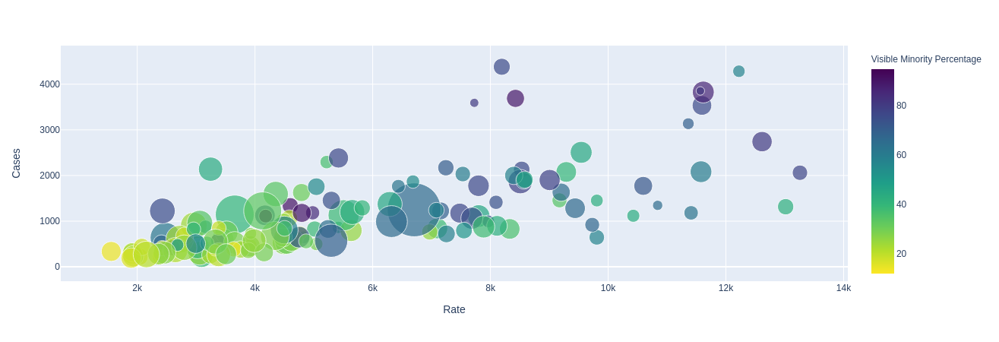

In [38]:
# bubble using plotly express
# plotly's built in colour scales: https://plotly.com/python/builtin-colorscales/
fig = px.scatter(trans, 
                 x="Rate",
                 y="Cases", 
                 size="Population density per square kilometre", 
                 color="Visible Minority Percentage",
                 color_continuous_scale=px.colors.sequential.Viridis_r,
                 hover_name="Neighbourhood", 
                 # log_x=True,
                 size_max=50
                )
#plotly.offline.plot(fig, filename='nightingale_bubble.html')
fig.show()

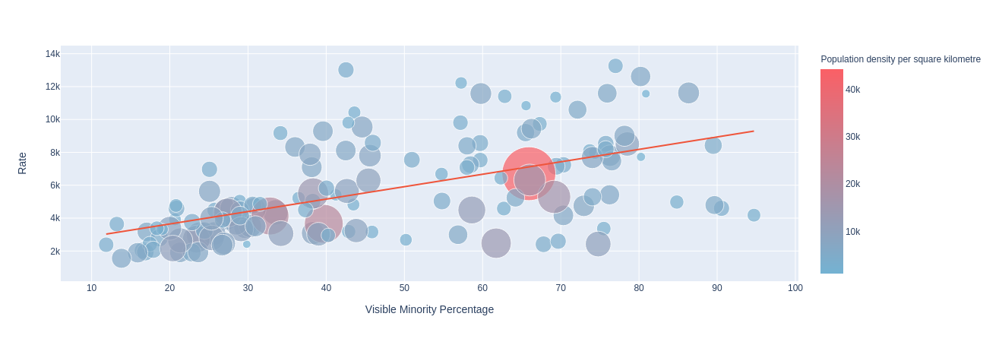

In [39]:
# bubble using plotly express
# see this to set discrete colour scale https://plotly.com/python/discrete-color/
fig = px.scatter(trans, 
                 x="Visible Minority Percentage",
                 y="Rate", 
                 size="Population density per square kilometre", 
                 color="Population density per square kilometre",
                 color_continuous_scale=[[0, '#74b3d3'], [1.0, '#fb6066']],
                 hover_name="Neighbourhood",
                 trendline="ols",
                 # log_x=True,
                 size_max=50
                )
#plotly.offline.plot(fig, filename='nightingale_bubble.html')
fig.show()

# watch what happens when you set x and color to visible minority percentage
# what would happen if we set a condition where we'd only draw from neighbourhoods above a certain population density?

In [40]:
trans.to_csv('data/toronto_neighbourhood_covid.csv')

In [60]:
# don't need this for the time being, but keep since it's a bit more current than the df from the API
# move this stuff back up to the top

# get COVID neighbourhood data from the city https://drive.google.com/file/d/1jzH64LvFQ-UsDibXO0MOtvjbL2CvnV3N/view
# this is all recent COVID cases
# https://www.toronto.ca/home/covid-19/covid-19-latest-city-of-toronto-news/covid-19-status-of-cases-in-toronto/
# need to set up to read from api instead of downloaded file
to_df = pd.read_excel('data/CityofToronto_COVID-19_NeighbourhoodData.xlsx', 1)
to_geo = gpd.read_file("geodata/NEIGHBORHOODS_WGS84.shp")

In [61]:
# get rid of trailing zeroes in ID column
to_df['Neighbourhood ID'] = to_df['Neighbourhood ID'].fillna(0)
to_df['Neighbourhood ID'] = to_df['Neighbourhood ID'].astype('int64')      
# to_df['Neighbourhood ID'] = to_df['Neighbourhood ID'].str.replace('.0', ' ')
to_df.sort_values(by=['Neighbourhood Name'], ascending=True)

,Neighbourhood ID,Neighbourhood Name,"Rate per 100,000 people",Case Count
79,129,Agincourt North,254.181981,74
41,128,Agincourt South-Malvern West,391.463569,93
35,20,Alderwood,414.800066,50
123,95,Annex,140.863526,43
137,42,Banbury-Don Mills,93.879762,26
...,...,...,...,...
105,94,Wychwood,174.228169,25
131,100,Yonge-Eglinton,118.473386,14
82,97,Yonge-St.Clair,231.481481,29
20,27,York University Heights,489.254521,135


In [62]:
# change ID to int64
to_geo['AREA_S_CD'] = to_geo['AREA_S_CD'].astype('int64')
# get rid of the bracketed IDs in the name field
to_geo['AREA_NAME'] = to_geo['AREA_NAME'].str.replace(" \\(\\d+\\)", "")
# fix Pelham Park
to_geo['AREA_NAME'] = to_geo['AREA_NAME'].replace('Weston-Pellam Park', 'Weston-Pelham Park') 
# fix Cabbagetown
to_geo['AREA_NAME'] = to_geo['AREA_NAME'].replace('Cabbagetown-South St.James Town', 'Cabbagetown-South St. James Town') 
# fix North St. James
to_geo['AREA_NAME'] = to_geo['AREA_NAME'].replace('North St.James Town', 'North St. James Town')
to_geo.sort_values(by=['AREA_NAME'], ascending=True)

<ipython-input-62-4fd9430e2b43>:4: FutureWarning:

The default value of regex will change from True to False in a future version.



,AREA_S_CD,AREA_NAME,geometry
79,129,Agincourt North,"POLYGON ((-79.24213 43.80247, -79.24319 43.802..."
80,128,Agincourt South-Malvern West,"POLYGON ((-79.25498 43.78122, -79.25797 43.780..."
86,20,Alderwood,"POLYGON ((-79.54866 43.59022, -79.54876 43.590..."
56,95,Annex,"POLYGON ((-79.39414 43.66872, -79.39588 43.668..."
84,42,Banbury-Don Mills,"POLYGON ((-79.33055 43.73979, -79.33044 43.739..."
...,...,...,...
137,94,Wychwood,"POLYGON ((-79.43592 43.68015, -79.43492 43.680..."
128,100,Yonge-Eglinton,"POLYGON ((-79.41096 43.70408, -79.40962 43.704..."
0,97,Yonge-St.Clair,"POLYGON ((-79.39119 43.68108, -79.39141 43.680..."
1,27,York University Heights,"POLYGON ((-79.50529 43.75987, -79.50488 43.759..."


In [63]:
# don't need any of these anymore, but keep for the sake of posterity

# get rid of the bracketed area code in the area name field
# find name of one of the neighbourhoods that doesn't show up because of name discrepancy
# to_df[to_df['Neighbourhood Name'].str.contains("Cabbagetown")]
# should probably just fix the full geojson directly

In [64]:
# add these so they'll show up in tooltips

# add rate from the pandas df to the geopandas df
# to_geo['Rate Per 100,000'] = to_df['Rate per 100,000 people']
# add case count from the pandas df to the geopandas df
# to_geo['Case Count'] = to_df['Case Count']

In [65]:
# change column names
to_geo = to_geo.rename(columns={'AREA_S_CD': "ID", 'AREA_NAME': "Neighbourhood", 'Case Count': "Cases", 'Rate Per 100,000': "Rate"})
to_df = to_df.rename(columns={'Neighbourhood ID': "ID", 'Neighbourhood Name': "Neighbourhood", 'Case Count': "Cases", 'Rate per 100,000 people': "Rate"})

In [66]:
to_df.sort_values(by=['Rate'], ascending=True)

,ID,Neighbourhood,Rate,Cases
139,101,Forest Hill South,55.907566,6
138,103,Lawrence Park South,72.468542,11
137,42,Banbury-Don Mills,93.879762,26
136,68,North Riverdale,100.704935,12
135,98,Rosedale-Moore Park,105.147445,22
...,...,...,...,...
3,31,Yorkdale-Glen Park,682.248041,101
2,13,Etobicoke West Mall,700.540176,83
1,24,Black Creek,717.670332,156
0,5,Elms-Old Rexdale,740.270728,70


In [67]:
to_geo.sort_values(by=['Neighbourhood'], ascending=True)

,ID,Neighbourhood,geometry
79,129,Agincourt North,"POLYGON ((-79.24213 43.80247, -79.24319 43.802..."
80,128,Agincourt South-Malvern West,"POLYGON ((-79.25498 43.78122, -79.25797 43.780..."
86,20,Alderwood,"POLYGON ((-79.54866 43.59022, -79.54876 43.590..."
56,95,Annex,"POLYGON ((-79.39414 43.66872, -79.39588 43.668..."
84,42,Banbury-Don Mills,"POLYGON ((-79.33055 43.73979, -79.33044 43.739..."
...,...,...,...
137,94,Wychwood,"POLYGON ((-79.43592 43.68015, -79.43492 43.680..."
128,100,Yonge-Eglinton,"POLYGON ((-79.41096 43.70408, -79.40962 43.704..."
0,97,Yonge-St.Clair,"POLYGON ((-79.39119 43.68108, -79.39141 43.680..."
1,27,York University Heights,"POLYGON ((-79.50529 43.75987, -79.50488 43.759..."


In [68]:
# use merge to get the columns from to_df
merged_geo = pd.merge(to_df, to_geo, on=['ID', 'Neighbourhood'])

In [69]:
# need this turn the merged df into a geo df (basically, to get folium to recognize the geometry)
merged_geo = GeoDataFrame(merged_geo)

In [70]:
map_cases = folium.Map(location=[43.653963, -79.387207], zoom_start=10)
# use this if want to load from a geojson file toronto_geo = "./geodata/to_geo.geojson"
folium.Choropleth(
    geo_data=merged_geo, # otherwise, use the geodataframe stored above
    data = to_df,
    columns=['Neighbourhood','Cases'],
    key_on='feature.properties.Neighbourhood',
    fill_color='YlOrRd',
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Case Count by Neighbourhood').add_to(map_cases)

folium.GeoJson(
        merged_geo, 
        name='Toronto Neighbourhoods',
        show=True,
        style_function=lambda feature: {
            # 'fillColor': 'YlOrRd',
            'color': 'YlOrRd',
            'weight': .1,
            'dashArray': '5, 5',
            'fillOpacity':0
        },   
        highlight_function=lambda x: {'weight':1, 
                                      'color':'black'
                                      #'fillOpacity':1
                                     },    
        tooltip=folium.features.GeoJsonTooltip(
            fields=['Neighbourhood', 'ID', 'Cases', 'Rate'],
            labels=True,                              
        ),  
).add_to(map_cases)
    
map_cases
# demonstrate how the PHU names in the public shapefile don't match

In [71]:
# interactive
map_rate = folium.Map(location=[43.653963, -79.387207], zoom_start=10)
# to_geo = "./geodata/to_geo.geojson"
folium.Choropleth(
    geo_data=merged_geo,
    data = to_df,
    columns=['Neighbourhood','Rate'],
    key_on='feature.properties.Neighbourhood',
    fill_color='YlOrRd',
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Rate per 100,000 people').add_to(map_rate)

folium.GeoJson(
        merged_geo, 
        name='Toronto Neighbourhoods',
        show=True,
        style_function=lambda feature: {
            # 'fillColor': 'YlOrRd',
            'color': 'YlOrRd',
            'weight': .1,
            'dashArray': '5, 5',
            'fillOpacity':0
        },   
        highlight_function=lambda x: {'weight':1, 
                                      'color':'black'
                                      #'fillOpacity':1
                                     },    
        tooltip=folium.features.GeoJsonTooltip(
            fields=['Neighbourhood', 'ID', 'Cases', 'Rate'],
            labels=True,                              
        ),  
).add_to(map_rate)
    
map_rate

# double-check that colors are accurate


In [72]:
# next steps: add 3D, customize tooltips, and make more maps
# maybe also do other regions or the entire country. what boundary-level data is available?
# https://towardsdatascience.com/an-interactive-3d-map-of-police-action-s-that-have-resulted-in-death-b9d7fbf81822
# https://medium.com/vis-gl/introducing-kepler-gl-for-jupyter-f72d41659fbf
# https://towardsdatascience.com/mapping-with-matplotlib-pandas-geopandas-and-basemap-in-python-d11b57ab5dac
# clean up tooltips https://towardsdatascience.com/using-folium-to-generate-choropleth-map-with-customised-tooltips-12e4cec42af2

In [73]:
# write to file for use in QGIS
merged_geo.to_file('geodata/merged_geo.geojson', driver='GeoJSON')

In [74]:
to_geo = to_geo.to_crs(epsg=4326)

In [75]:
# get centroids if want to use for hexbin 3D in kepler map

# centroid = to_geo['geometry'].to_crs()
# centroidseries = to_geo['geometry'].centroid
to_geo["x"] = to_geo['geometry'].centroid.x
to_geo["y"] = to_geo['geometry'].centroid.y

#def getXY(pt):
#    return (pt.x, pt.y)
#centroidseries = to_geo['geometry'].centroid
#x,y = [list(t) for t in zip(*map(getXY, centroidseries))]
#to_geo['geometry'].centroid
to_geo.head()

<ipython-input-75-48650a3875c9>:5: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.


<ipython-input-75-48650a3875c9>:6: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.




,ID,Neighbourhood,geometry,x,y
0,97,Yonge-St.Clair,"POLYGON ((-79.39119 43.68108, -79.39141 43.680...",-79.397871,43.687859
1,27,York University Heights,"POLYGON ((-79.50529 43.75987, -79.50488 43.759...",-79.488883,43.765738
2,38,Lansing-Westgate,"POLYGON ((-79.43998 43.76156, -79.44004 43.761...",-79.424747,43.754272
3,31,Yorkdale-Glen Park,"POLYGON ((-79.43969 43.70561, -79.44011 43.705...",-79.457108,43.714672
4,16,Stonegate-Queensway,"POLYGON ((-79.49262 43.64744, -79.49277 43.647...",-79.501128,43.635518


In [76]:
# sort to_df by rate (or count) to get the top 5 and bottom 5
trans_sorted = trans.sort_values(by=['Rate'], ascending=True)
trans_sorted.head()

Characteristic,Neighbourhood,Rate,Cases,Neighbourhood Number,TSNS2020 Designation,Population 2016,Population 2011,Population Change 2011-2016,Total private dwellings,Private dwellings occupied by usual residents,...,External migrants,Total - Mobility status 5 years ago - 25% sample data,Non-movers,Movers,Non-migrants,Migrants,Interprovincial migrants,External migrants,Visible Minority Percentage,Not a Visible Minority Percentage
116,The Beaches,1557.935735,336.0,63,No Designation,21567,21130,2.10%,9926,9428,...,300,20220,12595,7625,5405,2215,400,845,13.817406,85.616915
106,Runnymede-Bloor West Village,1896.722939,191.0,89,No Designation,10070,9632,4.50%,3987,3818,...,120,9295,6725,2575,1775,805,75,335,15.888779,84.061569
82,Mount Pleasant East,1913.561848,321.0,99,No Designation,16775,15982,5.00%,7715,7438,...,310,15720,10015,5695,3605,2095,370,965,22.801788,77.078987
68,Lawrence Park North,1916.889163,280.0,105,No Designation,14607,14541,0.50%,5622,5418,...,95,13615,9435,4185,2900,1280,155,565,21.291162,78.421305
88,North Riverdale,1930.177912,230.0,68,No Designation,11916,12191,-2.30%,5306,5008,...,85,11010,7455,3545,2615,930,145,360,23.623699,74.479691


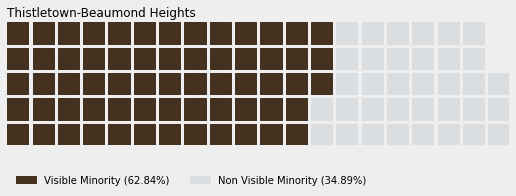

In [77]:
# waffles
data = {'Visible Minority': 62.84, 'Non Visible Minority': 34.89}

fig = plt.figure(
    FigureClass=Waffle, 
    rows=5, 
    values=data, 
    colors=("#45311f", "#dadee0"), # change colours to be more emotive
    title={'label': 'Thistletown-Beaumond Heights', 'loc': 'left'},
    labels=[f"{k} ({v}%)" for k, v in data.items()],
    legend={'loc': 'lower left', 'bbox_to_anchor': (0, -0.4), 'ncol': len(data), 'framealpha': 0},
    starting_location='NW',
    block_arranging_style='snake',
    tight=False,
    figsize=(9, 6)
)
fig.set_facecolor('#EEEEEE')
plt.show() # need to output to png
# fig.savefig('infographic/maple.png')

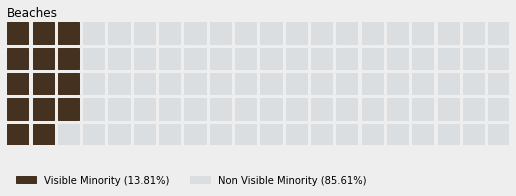

In [78]:
# waffles
data = {'Visible Minority': 13.81, 'Non Visible Minority': 85.61}

fig = plt.figure(
    FigureClass=Waffle, 
    rows=5, 
    values=data, 
    colors=("#45311f", "#dadee0"), # change colours to be more emotive
    title={'label': 'Beaches', 'loc': 'left'},
    labels=[f"{k} ({v}%)" for k, v in data.items()],
    legend={'loc': 'lower left', 'bbox_to_anchor': (0, -0.4), 'ncol': len(data), 'framealpha': 0},
    starting_location='NW',
    block_arranging_style='snake',
    tight=False,
    figsize=(9, 6)
)
fig.set_facecolor('#EEEEEE')
plt.show() # need to output to png
# fig.savefig('beaches.png')